<a href="https://colab.research.google.com/github/ahatesham02/Bangla-Image-Captioning/blob/main/Code/BAN_CAP_image_captioning_with_Attention_%2B_BiGRU_v1_with_zero_shot_exp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##New

In [ ]:


import string
import keras
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend import set_session
import sys, time, os, warnings
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd
from PIL import Image
import pickle
from collections import Counter
from keras.utils import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [ ]:
!wget -q https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip

!unzip -qq Flickr8k_Dataset.zip

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Image Caption Generation /Bancap/Bancap_preprocessed.csv')


In [ ]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = '/content/Flicker8k_Dataset'
images = listdir(image_dir)
print(len(images))

8091


In [ ]:
data.head(10)
data.drop(['Unnamed: 0'], axis =1, inplace=True)

In [ ]:
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি বাড়ির প্...
1,1000268201_693b08cb0e.jpg,একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে
2,1000268201_693b08cb0e.jpg,একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে
3,1000268201_693b08cb0e.jpg,ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠছে
4,1000268201_693b08cb0e.jpg,গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কাঠের তৈরি...


In [ ]:
from pickle import load

total_captions = load(open('/content/drive/MyDrive/Image Caption Generation /Bancap/bancap_captions.pkl', 'rb'))
img_name_vector = load(open('/content/drive/MyDrive/Image Caption Generation /Bancap/bancap_img_names.pkl', 'rb'))

In [ ]:
df = pd.DataFrame(list(zip(img_name_vector, total_captions)),
               columns =['filename', 'captions'])
df.head(10)

,filename,captions
0,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি গোলাপী জামা পরা বাচ্চা মেয়ে একটি ...
1,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি মেয়ে শিশু একটি কাঠের বাড়িতে ঢুকছে...
2,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> একটি বাচ্চা তার কাঠের খেলাঘরে উঠছে <...
3,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> ছোট মেয়েটি তার খেলার ঘরের সিড়ি বেয়ে উঠ...
4,/content/Flicker8k_Dataset/1000268201_693b08cb...,<start> গোলাপি জামা পড়া ছোট একটি মেয়ে একটি কা...
5,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর এবং একটি ছোপওয়ালা কুকু...
6,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর একটি তিন রঙা কুকুরের স...
7,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> একটি কালো কুকুর ও একটি সাদা বাদামি ছোপ...
8,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> ভিন্ন জাতের দুটি কুকুর রাস্তায় একে অপ...
9,/content/Flicker8k_Dataset/1001773457_577c3a7d...,<start> রাস্তার পাশে দুইটি কুকুর পরস্পরের দিকে...


In [ ]:
filt =['<start>','<unk>','<end>']

In [ ]:
grouped_df = df.groupby('filename')['captions'].apply(list).reset_index(name='captions')
grouped_df['captions'] = [[caption.split() for caption in captions] for captions in grouped_df['captions']]

In [ ]:
grouped_df['captions'][4]

[['<start>',
  'কমলা',
  'টুপি',
  'পরিহিত',
  'একজন',
  'পুরুষ',
  'কোনোকিছুর',
  'দিকে',
  'তাকিয়ে',
  'আছে',
  '<end>'],
 ['<start>',
  'একজন',
  'মানুষ',
  'কমলা',
  'রঙের',
  'টুপি',
  'পরেছ',
  'এবং',
  'চশমাও',
  'পরেছে',
  '<end>'],
 ['<start>',
  'চশমাযুক্ত',
  'একজন',
  'ব্যক্তি',
  'একটি',
  'ব্লিটজ',
  'টুপি',
  'পরেছেন',
  '<end>'],
 ['<start>',
  'চশমা',
  'পরিহিত',
  'একজন',
  'ব্যক্তি',
  'বিয়ারের',
  'কৌটা',
  'দিয়ে',
  'বানানো',
  'টুপি',
  'পরে',
  'আছে',
  '<end>'],
 ['<start>',
  'কান',
  'ফোঁড়ানো',
  'ব্যক্তিটি',
  'চশমা',
  'এবং',
  'কমলা',
  'টুপি',
  'পরেছে',
  '<end>']]

In [ ]:
for i, row in grouped_df.iterrows():
    captions = row['captions']
    captions = [caption[1:-1] for caption in captions]
    grouped_df.at[i, 'captions'] = captions

In [ ]:
grouped_df['captions'][4]

[['কমলা',
  'টুপি',
  'পরিহিত',
  'একজন',
  'পুরুষ',
  'কোনোকিছুর',
  'দিকে',
  'তাকিয়ে',
  'আছে'],
 ['একজন', 'মানুষ', 'কমলা', 'রঙের', 'টুপি', 'পরেছ', 'এবং', 'চশমাও', 'পরেছে'],
 ['চশমাযুক্ত', 'একজন', 'ব্যক্তি', 'একটি', 'ব্লিটজ', 'টুপি', 'পরেছেন'],
 ['চশমা',
  'পরিহিত',
  'একজন',
  'ব্যক্তি',
  'বিয়ারের',
  'কৌটা',
  'দিয়ে',
  'বানানো',
  'টুপি',
  'পরে',
  'আছে'],
 ['কান', 'ফোঁড়ানো', 'ব্যক্তিটি', 'চশমা', 'এবং', 'কমলা', 'টুপি', 'পরেছে']]

In [ ]:
grouped_df.captions[6]

[['সাদা',
  'বেড়ি',
  'যুক্ত',
  'ঘাসে',
  'আবৃত',
  'একটি',
  'বাগানে',
  'একটি',
  'সাদা',
  'কালো',
  'কুকুর',
  'দৌড়াচ্ছে'],
 ['একটি', 'সাদাকালো', 'রঙের', 'কুকুর', 'ঘাসের', 'উপর', 'দৌড়াচ্ছে'],
 ['ঘাসের', 'উপর', 'একটি', 'বোস্টন', 'টেরিয়ার', 'কুকুর', 'দৌড়াচ্ছে'],
 ['একটি',
  'বোস্টন',
  'টেরিয়ার',
  'জাতের',
  'কুকুর',
  'সাদা',
  'বেড়ার',
  'সামনে',
  'দিয়ে',
  'ঘন',
  'সবুজ',
  'ঘাসের',
  'মধ্যে',
  'দৌড়ে',
  'যাচ্ছে'],
 ['কাঠের', 'বেড়ার', 'পাশে', 'কুকুরটি', 'সবুজ', 'ঘাসের', 'উপর', 'দৌড়াচ্ছে']]

In [ ]:
train_data, test_data, train_caption, test_caption = train_test_split(img_name_vector, total_captions, test_size = 0.1, random_state = 42)

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications.resnet50 import ResNet50,preprocess_input

In [ ]:
image_model = ResNet50(include_top=False,weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, None, None,   0           ['input_1[0][0]']                
                                3)                                                                
                                                                                                  
 conv1_conv (Conv2D)            (None, None, None,   9472        ['conv1_pad[0][0]']              
                                64)                                                           

In [ ]:
preprocessed_image = []
IMAGE_SHAPE = (224, 224)

In [ ]:
for img in train_data[0:5] :
    img = tf.io.read_file(img, name=None)
    img = tf.image.decode_jpeg(img, channels=0)
    img = tf.image.resize(img, (224, 224))
    img = tf.keras.applications.resnet50.preprocess_input(img)
    preprocessed_image.append(img)

Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)
Shape after resize :  (224, 224, 3)


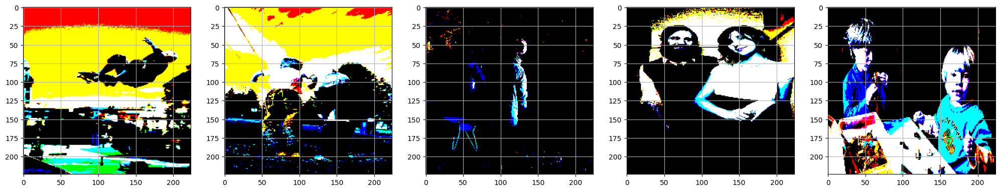

In [ ]:
# checking first five images post preprocessing
Display_Images = preprocessed_image[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(25)
for ax, image in zip(axes, Display_Images) :
  print('Shape after resize : ', image.shape)
  ax.imshow(image)
  ax.grid('off')

Shape after resize : (224, 224, 3)


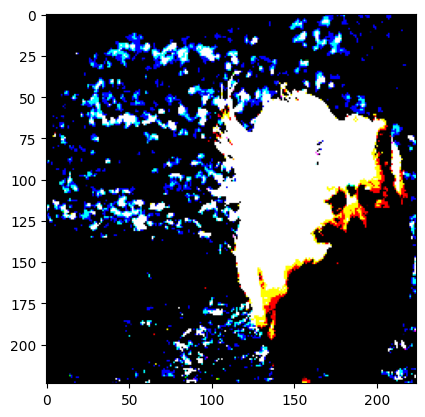

In [ ]:
def load_images(image_path) :
  img = tf.io.read_file(image_path, name = None)
  img = tf.image.decode_jpeg(img, channels=0)
  img = tf.image.resize(img, IMAGE_SHAPE)
  img = preprocess_input(img)
  return img, image_path

img1,img1_path = load_images("Flicker8k_Dataset/3439243433_d5f3508612.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

## Tokenizer and Vocabulary

In [ ]:
tokenizer = tf.keras.preprocessing.text.Tokenizer(
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')

tokenizer.fit_on_texts(train_caption)
train_seqs = tokenizer.texts_to_sequences(train_caption)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

train_seqs = tokenizer.texts_to_sequences(train_caption)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
vocab_size = len(tokenizer.index_word)+1

In [ ]:
vocab_size

14674

In [ ]:
train_caption[:3]

['<start> একজন লোক স্কেটবোর্ডে চড়ে শূন্যে লাফ দিয়ে ভেসে আছে <end>',
 '<start> দুজন শিশু বালক একটি সুন্দর দিনে পাডলের উপর খেলছে <end>',
 '<start> হুইলবারোর কাছে দাঁড়িয়ে থাকা দুটি শিশু তাদের সামনে হ্রদের দিকে তাকিয়ে আছে  <end>']

In [ ]:
train_seqs[:3]

[[2, 5, 9, 257, 182, 116, 38, 25, 656, 7, 3],
 [2, 69, 43, 68, 4, 667, 434, 7252, 13, 16, 3],
 [2, 7253, 121, 46, 84, 18, 43, 112, 39, 473, 37, 156, 7, 3]]

In [ ]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'একটি',
 5: 'একজন',
 6: 'কুকুর',
 7: 'আছে',
 8: 'এক',
 9: 'লোক',
 10: 'করছে',
 11: 'এবং',
 12: 'কালো',
 13: 'উপর',
 14: 'সাদা',
 15: 'মহিলা',
 16: 'খেলছে',
 17: 'বসে',
 18: 'দুটি',
 19: 'তার',
 20: 'রঙের',
 21: 'লাল',
 22: 'ছেলে',
 23: 'পরা',
 24: 'ছোট',
 25: 'দিয়ে',
 26: 'পরিহিত',
 27: 'ও',
 28: 'নীল',
 29: 'মধ্যে',
 30: 'বাচ্চা',
 31: 'দাঁড়িয়ে',
 32: 'নিয়ে',
 33: 'ব্যক্তি',
 34: 'পাশে',
 35: 'করে',
 36: 'দিচ্ছে',
 37: 'দিকে',
 38: 'লাফ',
 39: 'সামনে',
 40: 'দৌড়াচ্ছে',
 41: 'মেয়ে',
 42: 'ধরে',
 43: 'শিশু',
 44: 'যাচ্ছে',
 45: 'দিয়ে',
 46: 'দাঁড়িয়ে',
 47: 'থেকে',
 48: 'জামা',
 49: 'ঘাসের',
 50: 'পরে',
 51: 'বল',
 52: 'কুকুরটি',
 53: 'সাথে',
 54: 'নিয়ে',
 55: 'বাদামী',
 56: 'পানিতে',
 57: 'মেয়ে',
 58: 'কিছু',
 59: 'জন্য',
 60: 'সবুজ',
 61: 'একদল',
 62: 'হলুদ',
 63: 'মাঠে',
 64: 'পোশাক',
 65: 'দুই',
 66: 'মুখে',
 67: 'আছেন',
 68: 'বালক',
 69: 'দুজন',
 70: 'মানুষ',
 71: 'লোকটি',
 72: 'হাতে',
 73: 'দেখছে',
 74: 'সাইকেল',
 75: 'নারী',
 76: '

In [ ]:
# Pad each vector to the max_length of the captions  store it to a vairable

train_seqs_len = [len(seq) for seq in train_seqs]

longest_word_length = max(train_seqs_len)

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding= 'post', maxlen = longest_word_length,
                                                          dtype='int32', value=0)
print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(36000, 34)


In [ ]:
cap_vector

array([[    2,     5,     9, ...,     0,     0,     0],
       [    2,    69,    43, ...,     0,     0,     0],
       [    2,  7253,   121, ...,     0,     0,     0],
       ...,
       [    2,   187,   257, ...,     0,     0,     0],
       [    2, 14672,  1770, ...,     0,     0,     0],
       [    2,   216,    74, ...,     0,     0,     0]], dtype=int32)

## Creating Dataset

In [ ]:
# Map each image full path to the function, in order to preprocess the image
training_list = sorted(set(train_data))
New_Img = tf.data.Dataset.from_tensor_slices(training_list)
New_Img = New_Img.map(load_images, num_parallel_calls = tf.data.experimental.AUTOTUNE)
New_Img = New_Img.batch(64, drop_remainder=False)

In [ ]:
path_train, path_test, caption_train, caption_test = train_test_split(train_data, cap_vector, test_size = 0.1, random_state = 42)

In [ ]:
print("Training data for images: " + str(len(path_train)))
print("Testing data for images: " + str(len(path_test)))
print("Training data for Captions: " + str(len(caption_train)))
print("Testing data for Captions: " + str(len(caption_test)))

Training data for images: 32400
Testing data for images: 3600
Training data for Captions: 32400
Testing data for Captions: 3600


In [ ]:
from tqdm import tqdm

In [ ]:
New_Img

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [ ]:
# extract features from each image in the dataset
img_features = {}
for image, image_path in tqdm(New_Img) :
  batch_features = image_features_extract_model(image)
  #squeeze out the features in a batch
  batch_features_flattened = tf.reshape(batch_features, (batch_features.shape[0], -1, batch_features.shape[3]))
  for batch_feat, path in zip(batch_features_flattened, image_path) :
    feature_path = path.numpy().decode('utf-8')
    img_features[feature_path] = batch_feat.numpy()

100%|██████████| 125/125 [00:42<00:00,  2.95it/s]


In [ ]:
batch_features

<tf.Tensor: shape=(64, 7, 7, 2048), dtype=float32, numpy=
array([[[[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 4.7711940e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.1169077e+00],
         ...,
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 0.0000000e+00]],

        [[0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 1.2774032e+00],
         [0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ...,
          0.0000000e+00, 0.0000000e+00, 5.0966322e-01]

In [ ]:
batch_features_flattened

<tf.Tensor: shape=(64, 49, 2048), dtype=float32, numpy=
array([[[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  4.771194  ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  1.1169077 ],
        ...,
        [ 0.        ,  0.        ,  0.        , ...,  7.961609  ,
          0.        ,  0.        ],
        [ 0.21795821,  0.        ,  0.        , ...,  1.0829487 ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  1.4408458 ,
          0.        ,  1.5932412 ]],

       [[ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        [ 0.        ,  0.        ,  0.        , ...,  0.        ,
          0.        ,  0.        ],
        ...

In [ ]:
batch_feat.shape

TensorShape([49, 2048])

In [ ]:
img_features

{'/content/Flicker8k_Dataset/1000268201_693b08cb0e.jpg': array([[0.       , 0.       , 0.       , ..., 3.2088284, 0.       ,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
         0.       ],
        [0.       , 2.5231423, 0.       , ..., 0.       , 0.       ,
         0.       ],
        ...,
        [0.       , 0.       , 0.       , ..., 0.       , 6.8373046,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 3.8534644,
         0.       ],
        [0.       , 0.       , 0.       , ..., 0.       , 4.3590107,
         0.       ]], dtype=float32),
 '/content/Flicker8k_Dataset/1001773457_577c3a7d70.jpg': array([[0.        , 0.        , 0.        , ..., 0.61871135, 0.        ,
         0.        ],
        [1.4099102 , 0.        , 0.        , ..., 0.        , 5.1975617 ,
         0.        ],
        [4.414052  , 0.        , 0.5123825 , ..., 0.        , 4.637478  ,
         0.        ],
        ...,
        [0.062016

In [ ]:
#to provide, both images along with the captions as input
def map(image_name, caption):
    img_tensor = img_features[image_name.decode('utf-8')]
    return img_tensor, caption

In [ ]:
# This function should transform the created dataset(img_path,cap) to (features,cap) using the map_func created earlier
BUFFER_SIZE = 1000
BATCH_SIZE = 64
def gen_dataset(img, capt):

    data = tf.data.Dataset.from_tensor_slices((img, capt))
    data = data.map(lambda ele1, ele2 : tf.numpy_function(map, [ele1, ele2], [tf.float32, tf.int32]),
                    num_parallel_calls = tf.data.experimental.AUTOTUNE)


    data = (data.shuffle(BUFFER_SIZE, reshuffle_each_iteration= True).batch(BATCH_SIZE, drop_remainder = False)
    .prefetch(tf.data.experimental.AUTOTUNE))
    return data

In [ ]:
train_dataset = gen_dataset(path_train,caption_train)
test_dataset = gen_dataset(path_test,caption_test)

In [ ]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,max_len)

(64, 49, 2048)
(64, 34)


In [ ]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
train_num_steps = len(path_train) // BATCH_SIZE
test_num_steps = len(path_test) // BATCH_SIZE
EPOCHS = 20
max_length = 108
feature_shape = batch_feat.shape[1]
attention_feature_shape = batch_feat.shape[0]

In [ ]:
vocab_size

14674

In [ ]:
feature_shape

2048

In [ ]:
attention_feature_shape

49

## CNN Encoder

In [ ]:
from keras.utils.vis_utils import plot_model

In [ ]:
tf.compat.v1.reset_default_graph()
print(tf.compat.v1.get_default_graph())

In [ ]:
#Building Encoder using CNN Keras subclassing method

class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation

    def call(self, features):
        features =  self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features =  tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0)
        return features

In [ ]:
encoder=Encoder(embedding_dim)

## Attention Model

In [ ]:
class Bahdanau_Attention(Model):
    def __init__(self, units):
        super(Bahdanau_Attention, self).__init__()
        self.units=units
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)


    def call(self, features, hidden):
        hidden_with_time_axis = hidden[:, tf.newaxis]
        score = tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        attention_weights = tf.keras.activations.softmax(self.V(score), axis=1)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector, attention_weights

In [ ]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Bahdanau_Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state,_ = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
class Decoder2(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder2, self).__init__()
        self.units=units
        self.attention = Bahdanau_Attention(self.units) #iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim) #build your Embedding layer
        self.gru = tf.keras.layers.Bidirectional(tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform'))
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size) #build your Dense layer


    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden) #create your context vector & attention weights from attention model
        embed = self.embed(x) # embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis = -1) # Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state_f,state_b = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        #print(output.shape)
        #print(state_f.shape)
        #print(state_b.shape)
        state = tf.keras.layers.Add()([state_f, state_b])
        #print(state.shape)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)
        return output, state, attention_weights

    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
decoder=Decoder2(embedding_dim, units, vocab_size)

In [ ]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim

Feature shape from Encoder: (64, 49, 256)
Predcitions shape from Decoder: (64, 14674)
Attention weights shape from Decoder: (64, 49, 1)


In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)  #define the optimizer
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True, reduction = tf.keras.losses.Reduction.NONE)

In [ ]:
def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    #loss is getting multiplied with mask to get an ideal shape

    return tf.reduce_mean(loss_)

In [ ]:
checkpoint_path = "/content/drive/MyDrive/Image Caption Generation /Bancap/Models/"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [ ]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:

        encoder_op = encoder(img_tensor)
        for r in range(1, target.shape[1]) :
          predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
          loss = loss + loss_function(target[:, r], predictions)
          dec_input = tf.expand_dims(target[:, r], 1)

    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))

    return loss, avg_loss

In [ ]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    hidden = decoder.init_state(batch_size = target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    with tf.GradientTape() as tape:
      encoder_op = encoder(img_tensor)
      for r in range(1, target.shape[1]) :
        predictions, hidden, _ = decoder(dec_input, encoder_op, hidden)
        loss = loss + loss_function(target[:, r], predictions)
        dec_input = tf.expand_dims(target[: , r], 1)
    avg_loss = (loss/ int(target.shape[1])) #avg loss per batch
    trainable_vars = encoder.trainable_variables + decoder.trainable_variables
    grad = tape.gradient (loss, trainable_vars)
    optimizer.apply_gradients(zip(grad, trainable_vars))
    return loss, avg_loss

In [ ]:
def test_loss_cal(test_dataset):
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset) :
      batch_loss, t_loss = test_step(img_tensor, target)
      total_loss = total_loss + t_loss
      avg_test_loss = total_loss/ test_num_steps

    return avg_test_loss

In [ ]:
loss_plot = []
test_loss_plot = []
EPOCHS = 30
best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
    loss_plot.append(avg_train_loss)
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

In [ ]:
ckpt_manager.checkpoints

In [ ]:
ckpt.restore('/content/drive/MyDrive/Image Caption Generation /Bancap/Models/ckpt-27')

In [ ]:
from matplotlib.pyplot import figure
figure(figsize=(12, 8))
plt.plot(loss_plot, color='orange', label = 'training_loss_plot')
plt.plot(test_loss_plot, color='green', label = 'test_loss_plot')
plt.xlabel('Epochs', fontsize = 15, color = 'red')
plt.ylabel('Loss', fontsize = 15, color = 'red')
plt.title('Loss Plot', fontsize = 20, color = 'red')
plt.legend()
plt.show()

In [ ]:
attention_feature_shape

In [ ]:
attention_plot = np.zeros((max_length, attention_feature_shape))
attention_plot

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt
font_path = '/content/drive/MyDrive/Image Caption Generation /SolaimanLipi_20-04-07.ttf'
prop = fm.FontProperties(fname=font_path)

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_feature_shape))

    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(load_images(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder (img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append (tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [ ]:
def plot_attention_map(caption, weights, image) :

  fig = plt.figure(figsize = (12, 12))
  temp_img = np.array(Image.open(image))

  cap_len = len(caption)
  for cap in range(len(caption)) :
    weights_img = np.reshape(weights[cap], (7,7))
    wweights_img = np.array(Image.fromarray(weights_img).resize((224,224), Image.LANCZOS))

    ax = fig.add_subplot(cap_len//2, cap_len//2, cap+1)
    ax.set_title(caption[cap], fontsize = 38, color = 'red',fontproperties=prop)

    img = ax.imshow(temp_img)

    ax.imshow(weights_img, cmap='gray', alpha=0.6, extent=img.get_extent())
    ax.axis('off')
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  plt.show()

In [ ]:
def filt_text(text):
    filt=['<start>','<unk>','<end>']
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [ ]:
image_test = path_test.copy()

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu, SmoothingFunction

In [ ]:
import nltk
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
from nltk.translate.meteor_score import meteor_score

In [ ]:
encoder.save_weights('content/outputs_encoder')
decoder.save_weights('.content/outputs_decoder')

In [ ]:
path_test

['/content/Flicker8k_Dataset/3541915243_956c1aa8ef.jpg',
 '/content/Flicker8k_Dataset/3165936115_cb4017d94e.jpg',
 '/content/Flicker8k_Dataset/3462454965_a481809cea.jpg',
 '/content/Flicker8k_Dataset/138718600_f430ebca17.jpg',
 '/content/Flicker8k_Dataset/3520079657_b828d96d50.jpg',
 '/content/Flicker8k_Dataset/3473264983_67917a931f.jpg',
 '/content/Flicker8k_Dataset/1289142574_2bd6a082dd.jpg',
 '/content/Flicker8k_Dataset/2972929655_04233b5489.jpg',
 '/content/Flicker8k_Dataset/447733067_09cfac3286.jpg',
 '/content/Flicker8k_Dataset/3415003392_139c0f3586.jpg',
 '/content/Flicker8k_Dataset/2130851544_d36f4f2ea6.jpg',
 '/content/Flicker8k_Dataset/374176648_ba4b88c221.jpg',
 '/content/Flicker8k_Dataset/1347519824_e402241e4f.jpg',
 '/content/Flicker8k_Dataset/3506096155_13632955e8.jpg',
 '/content/Flicker8k_Dataset/3277162496_dff7eeb59e.jpg',
 '/content/Flicker8k_Dataset/2555535057_007501dae5.jpg',
 '/content/Flicker8k_Dataset/2537119659_fa01dd5de5.jpg',
 '/content/Flicker8k_Dataset/30716

BLEU-1: 47.768754
BLEU-2: 37.001518
BLEU-3: 27.735925
BLEU-4: 17.999149
Meteor Score: 0.480769
Real Caption: দুই বাচ্চা তাদের কুকুর নিয়ে বরফের মধ্যে খেলছে
Prediction Caption: দুটি বাচ্চা তাদের কুকুর বরফে খেলছে


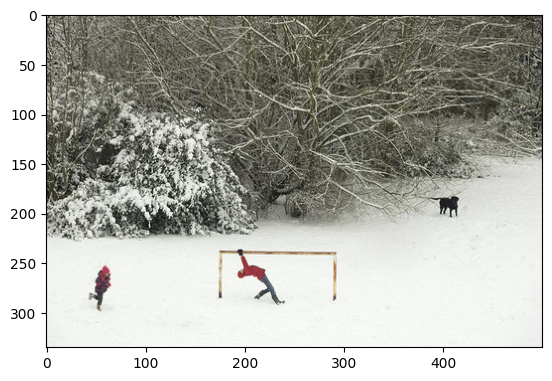

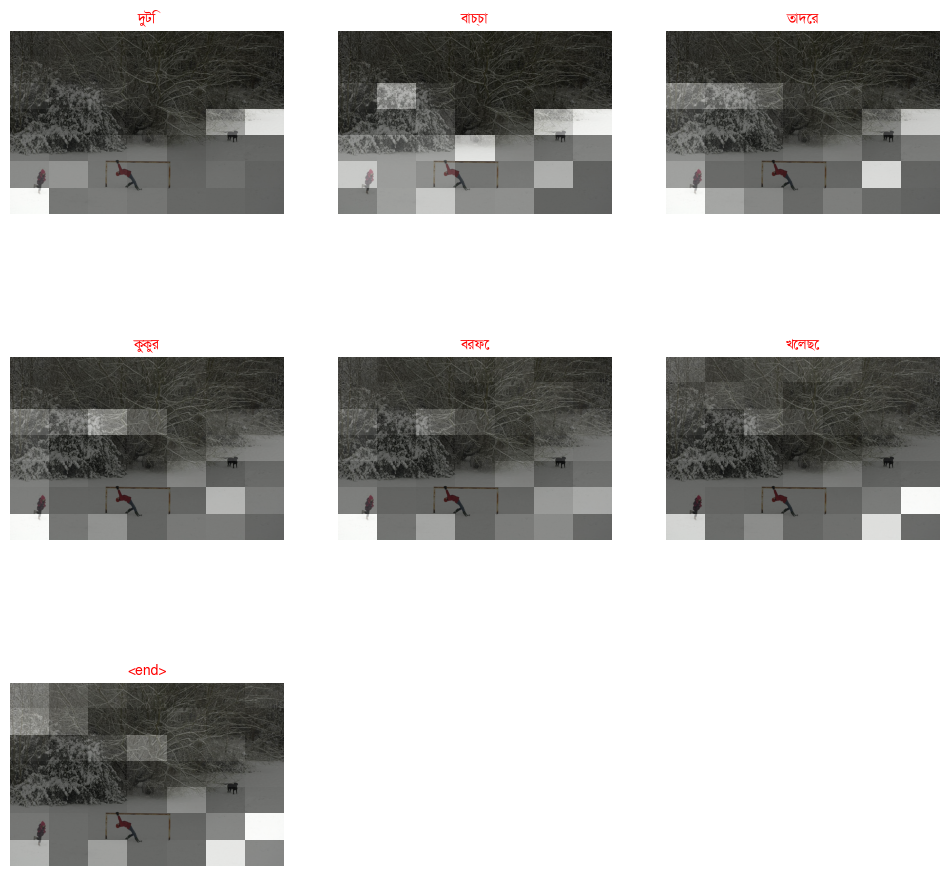

In [ ]:
cap_test_data = caption_test.copy()
rid = 101

test_image= path_test[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test_data[rid] if i not in [0]])
result, attention_plot, pred_test = evaluate(test_image)
real_caption=filt_text(real_caption)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)
score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', pred_caption)

plot_attention_map(result, attention_plot, test_image)


In [ ]:
len(test_data)

4000

## Evaluation

Real Caption: ['কাপড়ের উপর সিশুটি শুয়ে আছে', 'এক ছোট্ট ছেলে প্রাণখোলা হাসি হাসতেছে', 'নীল শার্ট পরে একজন শিশু মুখ খুলে শুয়ে আছে', 'এক শিশু ও একটি প্রাপ্তবয়স্ক হাত', 'সুড়সুড়ি দেওয়ায় ছোট্ট বালকটি হাসছে']
Prediction Caption: একটি ছেলে একজন মেয়ের মুখ খুলে শুয়ে আছে
BLEU-1: 77.218479
BLEU-2: 54.041678
BLEU-3: 42.521507
BLEU-4: 35.091198
Meteor Score: 0.543820


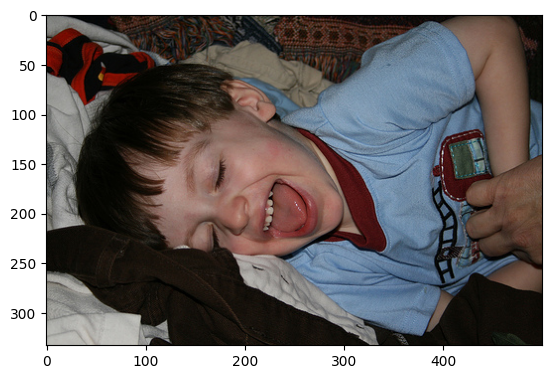

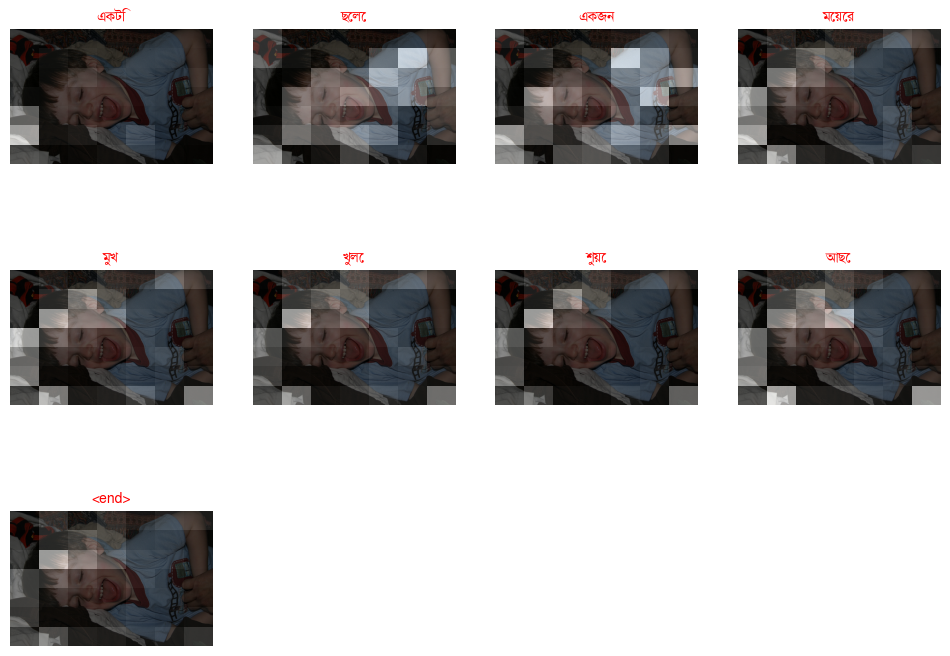

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['পেইন্ট দিয়ে আচ্ছাদিত একটি শিশু পুরোপুরি পেইন্টের সাথে পরিপূর্ণভাবে ভূপৃষ্ঠে বহু রঙযুক্ত রঙের ট্রেগুলির মাঝে বসে', 'একটি বাচ্চা রঙের সাথে খেলছে', 'সাদা রঙের জামা পরিহিত একটি বাচ্চা মেয়ে রঙ নিয়ে খেলা করছে এবং পুরো কক্ষ ও তার শরীর রঙ দিয়ে ভরে ফেলেছে', 'জগাখিচুরি রঙের মধ্যে একটি শিশু বসে আছে', 'এক ছোট বাচ্চা সর্বত্র রঙ ছিটিয়ে থাকা মেঝেতে বসা']
Prediction Caption: পেইন্ট দিয়ে আচ্ছাদিত একটি শিশু বসে আছে
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 93.060486
Meteor Score: 0.566964


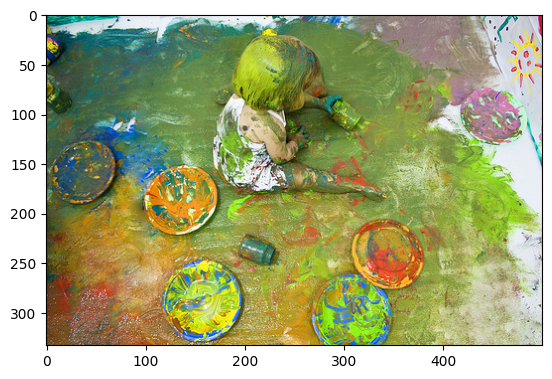

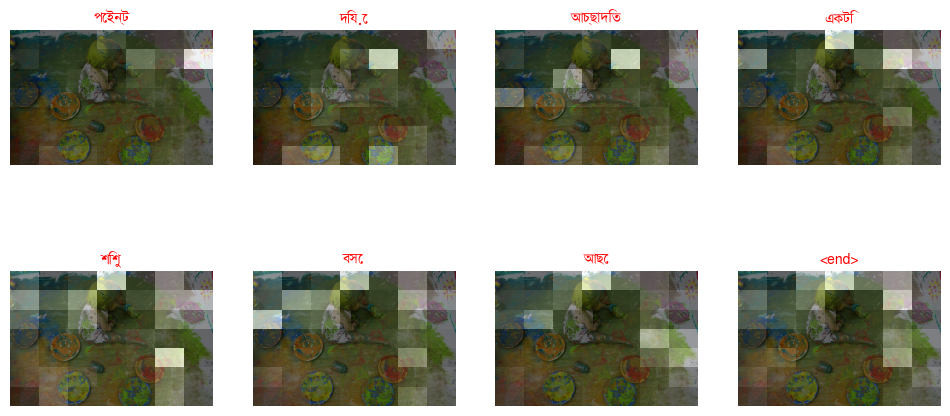

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['চারজন বালক শোবার ঘরে কথা বলছে', 'চারটি ছেলেকে একটি বাড়িতে খেলছে দেখানো হয় এবং তারা সবাই টি শার্ট পরে আছে', 'বেশ কিছু তরুণ ছেলে কম্পিউটারে তাকিয়ে আছে', 'ফোনে চারজন কথা বলার সময় তিন ছেলে একটি ল্যাপটপ কম্পিউটারের দিকে তাকাচ্ছে', 'বালকেরা কম্পিউটারের চারপাশে বসা']
Prediction Caption: বালকেরা কম্পিউটারের চারপাশে বসা
BLEU-1: 100.000000
BLEU-2: 100.000000
BLEU-3: 100.000000
BLEU-4: 100.000000
Meteor Score: 0.992188


ValueError: ignored

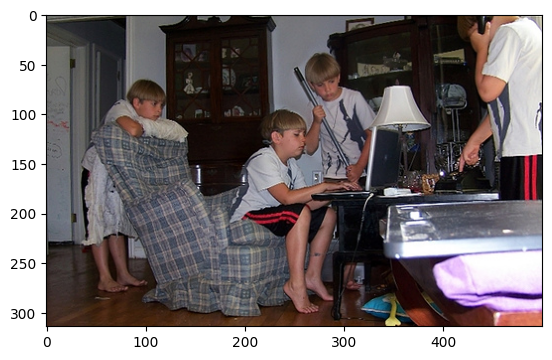

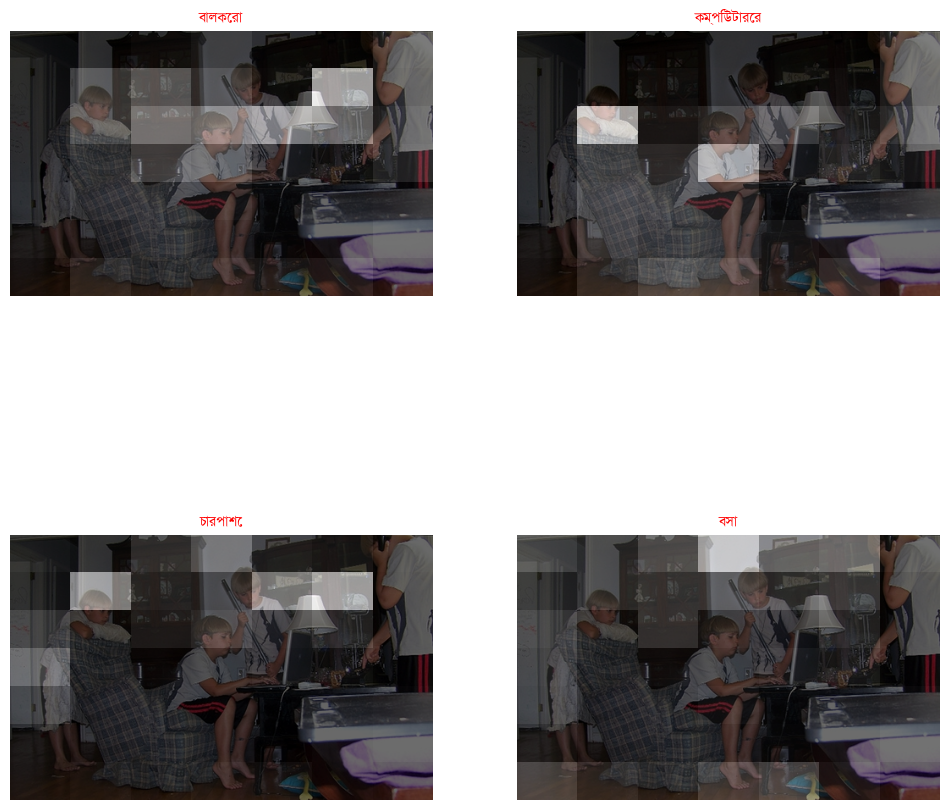

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একদল লোক একটি টেবিলে বসে আছে', 'এক পুরুষ ও নারী ডেস্কে বসে আছে আরেক পুরুষ প্রথম জনের পিছনে দাঁড়িয়ে আছে', 'তিনজন প্রাপ্তবয়স্ক লোক কাজ করছে', 'একটি অফিসে দুইজন লোক এবং একজন মহিলা', 'কালো পোশাক পরা দুজন পুরুষ হাসছে যখন তাদের পিছনে মহিলাটিকে ক্লান্ত দেখায়']
Prediction Caption: একজন পুরুষ ও নারী ডেস্কে বসে আছে আরেক পুরুষ প্রথম জনের পিছনে দাঁড়িয়ে আছে
BLEU-1: 100.000000
BLEU-2: 96.076892
BLEU-3: 94.307610
BLEU-4: 93.651376
Meteor Score: 0.928360


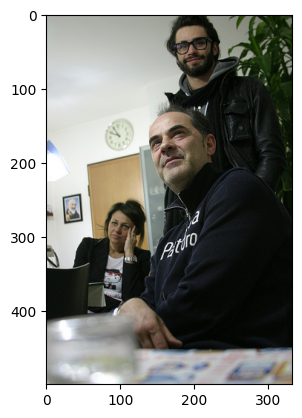

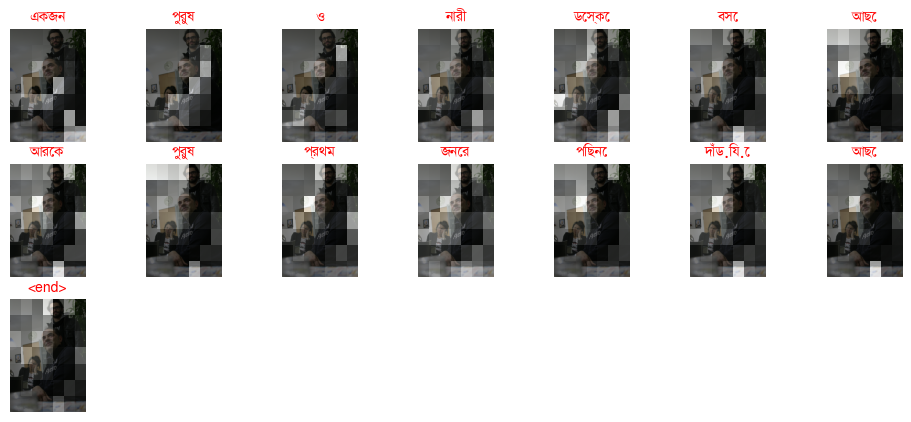

In [ ]:
cap_test_data = test_caption.copy()
rid = np.random.randint(0, len(test_data))
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কালো কুকুর ক্যামেরার দিকে দৌড়াচ্ছে', 'একটি কালো কুকুর ঘাসের উপর দোড়াচ্ছে', 'একটি কালো কুকুর একটি বাদামী এবং সাদা কুকুরের কাছাকাছি ঘাসের উপর ছুটে চলেছে', 'শুকনো ঘাসের মধ্যে দিয়ে একটি কালো কুকুর দৌড়ে যায়', 'একটি কুকুর ক্যামেরার দিকে এগিয়ে আসছে আর একটি পিছনে হেঁটে যাচ্ছে']
Prediction Caption: একটি কুকুর ক্যামেরার দিকে এগিয়ে যাচ্ছে
BLEU-1: 100.000000
BLEU-2: 89.442719
BLEU-3: 83.520361
BLEU-4: 79.527073
Meteor Score: 0.625000


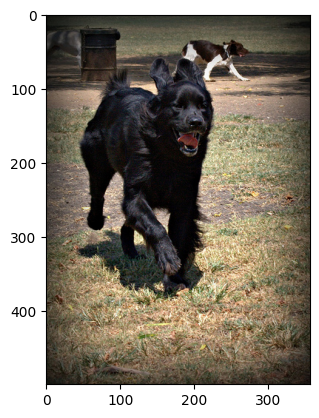

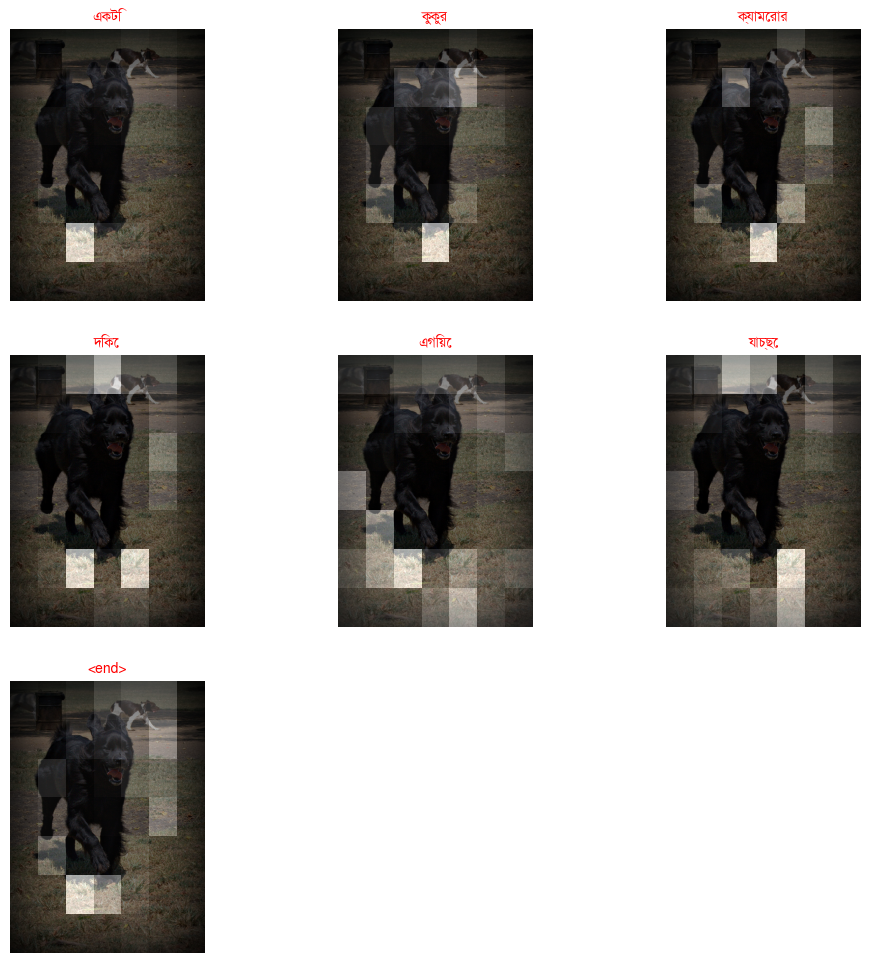

In [ ]:
cap_test_data = test_caption.copy()
rid = 100
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি ব্রিন্ডল লেপযুক্ত কুকুর একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি জাম্পিং ব্রাউন কুকুরের দিকে ঘেউ ঘেউ করছে', 'দুটি কুকুর খেলছে একজন লোক তা দেখছে', 'খেলা করা দুটি কুকুরের সাথে একজন লোক দাঁড়িয়ে আছেন', 'একটি লোক একটি খেঁকী বাদামী ও কালো কুকুর এবং একটি দাঁড়ানো হালকা বাদামী কুকুরের পাশে দাঁড়িয়ে আছে', 'দুটি কুকুর একটি বাদামী এবং একটি ধুসর বর্ণের জিন্স পরা এক ব্যাক্তির পায়ের পাশে খেলছে']
Prediction Caption: একটি কুকুর একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের অভ্যন্তরে বেগুনি রঙের কলারযুক্ত একটি বৃদ্ধ লোক একটি পার্কের ঘেরের 

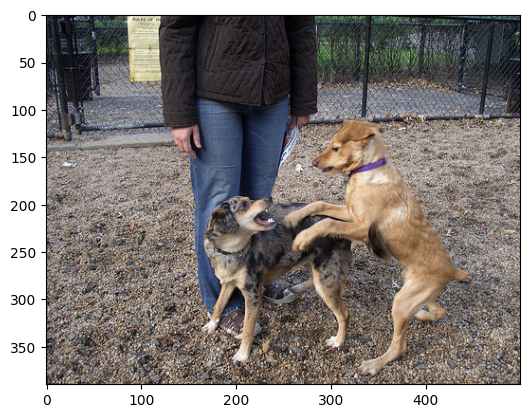

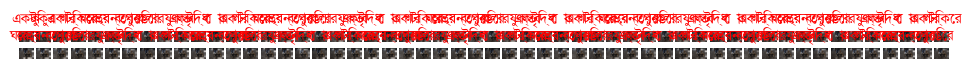

In [ ]:
cap_test_data = test_caption.copy()
rid = 1205
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি হকি খেলা হচ্ছে', 'দুজন মানুষ খেলার পোশাকে মাঠে দৌড়াচ্ছে', 'বেগুনি সাদা এবং কালো রঙের একটি খেলোয়াড় মাঠের শেষের কাছে একটি নাটক তৈরি করার চেষ্টা করে', 'পনেরো নম্বর জার্সি পরিহিত একজন খেলোয়াড় ল্যাক্রোস বল নিয়ে দৌড়াচ্ছে', 'দুজন লাক্রোসে খেলোয়াড় খেলার মাঠে দৌড়াচ্ছে']
Prediction Caption: বেগুনি সাদা কালো রঙের খেলা খেলা সময় একটি মাঠে বল ছুঁড়ে মারলো
BLEU-1: 66.666667
BLEU-2: 34.815531
BLEU-3: 12.700913
BLEU-4: 8.030146
Meteor Score: 0.285897


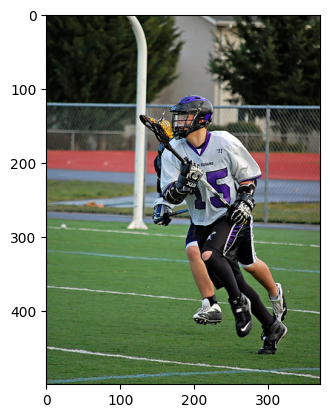

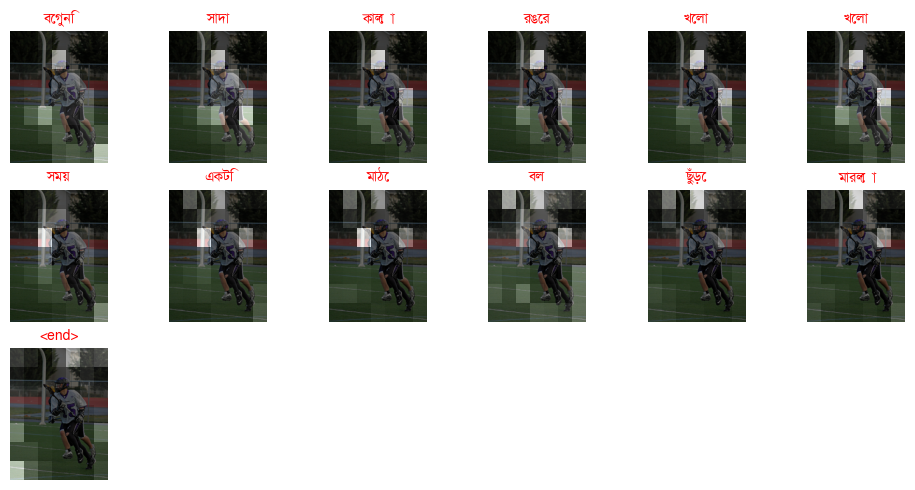

In [ ]:
cap_test_data = test_caption.copy()
rid = 2408
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কাউবয় টুপি পরা মেয়েটি একটি ভেড়া নিয়ে দাঁড়িয়ে আছে', 'একটি গোলাপী টুপি পরা একটি মেয়ে ধূলিকণা পথে ভেড়ার পাশে হাঁটছে', 'গোলাপি টুপি পরে মেয়েটি একটি ভেড়া নিয়ে হাঁটছে', 'গোলাপি রাখাল টুপি পড়া এক ছোট মেয়ে একটি ফিতায় বাধা ভেড়া ধরে আছে', 'মেয়েটি পিংক রংয়ের রাখালী টুপি এবং পিংক বুট পরেছে']
Prediction Caption: গোলাপি রঙের পোশাক পরা মেয়েটি একটি ভেড়া নিয়ে দাঁড়িয়ে আছে
BLEU-1: 80.000000
BLEU-2: 73.029674
BLEU-3: 68.294415
BLEU-4: 66.063286
Meteor Score: 0.768109


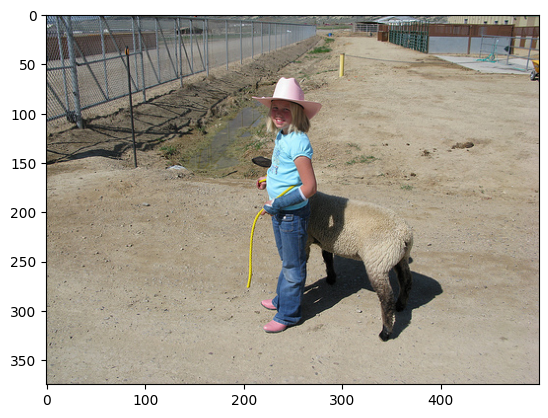

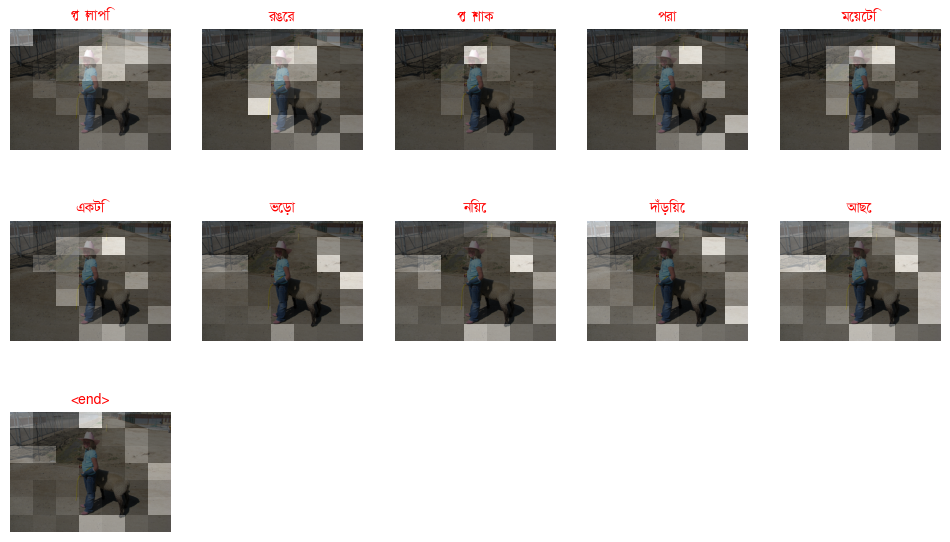

In [ ]:
cap_test_data = test_caption.copy()
rid = 161
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['বৃদ্ধ লোকটি থাম্বস আপ দিচ্ছেন', 'ধূসর দাড়ি এবং ডেনিম টুপিযুক্ত একটি মানুষ হাত দিয়ে থাম্বস আপ সাইন দেয়', 'একটি সাদা কেশিক দাড়ি এবং একটি নীল ক্যাপযুক্ত একটি বৃদ্ধ ব্যক্তি তার ডান হাত দিয়ে থাম্বস আপ সাইন দেয়', 'সাদা দাড়ি ওয়ালা লোকটি বৃদ্ধাঙ্গুলি দেখাচ্ছে', 'সাদা ক্যাপ পড়া বয়স্ক ব্যক্তি থাম্বস আপ দেখাচ্ছে']
Prediction Caption: একজন বৃদ্ধ লোক নিচে তাকিয়ে আছে
BLEU-1: 16.666667
BLEU-2: 7.728216
BLEU-3: 4.525874
BLEU-4: 3.759340
Meteor Score: 0.098039


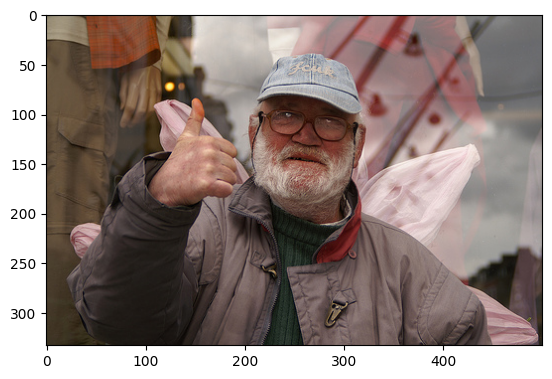

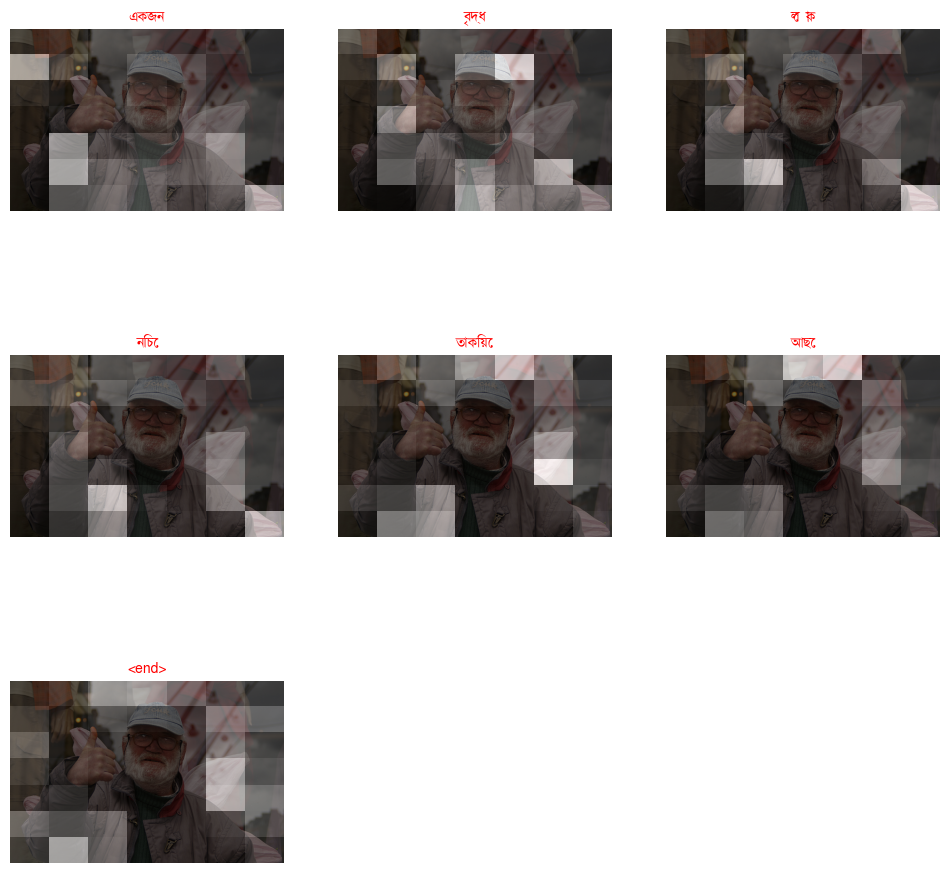

In [ ]:
cap_test_data = test_caption.copy()
rid = 235
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি কালো সাদা কুকুর একটি কাঠের তক্তার উপর ভারসাম্য রাখছে', 'কুকুরটি একটি কাঠ দন্ডের উপর হাঁটছে', 'একটি কুকুর প্লাটফর্মের উপরে এক্রোবেটিক কৌশল প্রদর্শন করছে', 'নীল রেলিং এর পাশে লাল কাঠের তক্তার উপর একটি কুকুর হাঁটছে', 'একটি উঁচু তক্তার উপর কুকুরটি হাঁটছে']
Prediction Caption: একটি কুকুর প্লাটফর্মের উপরে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার সময় একটি লাল রেলিং বেয়ে এক্রোবেটিক কৌশল করার সময় এক্রোবেটিক কৌশল করার
BLEU-1: 8.411215
BLEU-2: 6.298852
BLEU-3: 4.813

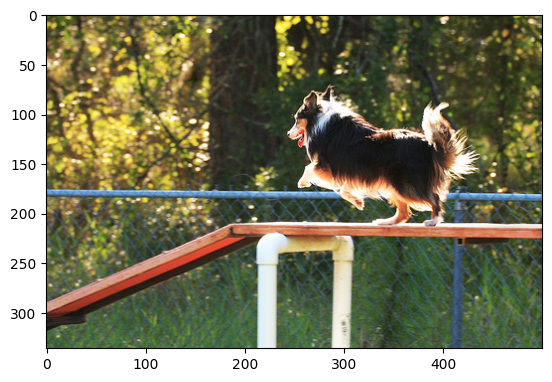

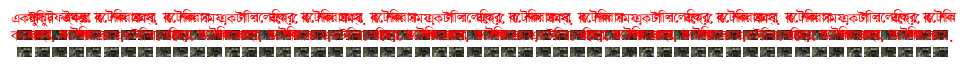

In [ ]:
cap_test_data = test_caption.copy()
rid = 2935
test_image= test_data[rid]
real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
b1=[]
b2=[]
b3=[]
b4=[]
m_score = []

for rid in range(0,len(test_data)):
  test_image= test_data[rid]
  real_caption = grouped_df.loc[grouped_df['filename'] == test_image, 'captions'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1.append(bleu1)
  b2.append(bleu2)
  b3.append(bleu3)
  b4.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score.append(score)

In [ ]:
print('BLEU-1: %f' % np.mean(b1))
print('BLEU-2: %f' % np.mean(b2))
print('BLEU-3: %f' % np.mean(b3))
print('BLEU-4: %f' % np.mean(b4))

In [ ]:
print('Meteor Score : %f' % np.mean(m_score))

## Zero shot test with Banglalekha

In [ ]:
!wget https://data.mendeley.com/public-files/datasets/rxxch9vw59/files/220ffc5a-8645-4c0b-bd1b-97188836ed3b/file_downloaded

--2023-04-04 04:54:12--  https://data.mendeley.com/public-files/datasets/rxxch9vw59/files/220ffc5a-8645-4c0b-bd1b-97188836ed3b/file_downloaded
Resolving data.mendeley.com (data.mendeley.com)... 162.159.130.86, 162.159.133.86
Connecting to data.mendeley.com (data.mendeley.com)|162.159.130.86|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com/6312cfc2-6930-4530-9589-105499b29d5e [following]
--2023-04-04 04:54:14--  https://prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com/6312cfc2-6930-4530-9589-105499b29d5e
Resolving prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com (prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com)... 52.92.35.106, 52.92.1.106, 52.218.105.195, ...
Connecting to prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com (prod-dcd-datasets-public-files-eu-west-1.s3.eu-west-1.amazonaws.com)|52.92.35.106|:44

In [ ]:
import zipfile
exfile= '/content/file_downloaded'
zip_ref = zipfile.ZipFile(exfile, 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
from os import listdir

image_dir = '/content/images'
images = listdir(image_dir)

In [ ]:
train_captions_bangla = load(open('/content/drive/MyDrive/Image Caption Generation /BanglaLekha/banglalekhal_captions.pkl', 'rb'))
img_name_vector_bangla = load(open('/content/drive/MyDrive/Image Caption Generation /BanglaLekha/banglalekhal_img_names.pkl', 'rb'))

In [ ]:
df = pd.DataFrame(list(zip(img_name_vector_bangla, train_captions_bangla)),
               columns =['filename_bn', 'captions_bn'])
df.head(10)

,filename_bn,captions_bn
0,/content/images/1.png,<start> তিন জন মেয়ে মানুষ আছে এক জন দাড়িয়ে আছ...
1,/content/images/2.png,<start> অনেক মেয়ে মানুষ বসে আছে <end>
2,/content/images/3.png,<start> অনেক মানুষ একসাথে বসে কাজ করছে <end>
3,/content/images/4.png,<start> ছয় জন মানুষ দাড়িয়ে আছে <end>
4,/content/images/5.png,<start> এক জন মেয়ে মানুষ মাথায় ঘোমটা দিয়ে কাজ ...
5,/content/images/6.png,<start> আবছা অন্ধকারে এক জন মানুষ দাড়িয়ে আছে ...
6,/content/images/7.png,<start> তিন জন মানুষ আছে এক জন মাথায় ছাতা ধরে...
7,/content/images/8.png,<start> খালি গায়ে একটি বাচ্চা ছাতার নিচে বসে ক...
8,/content/images/9.png,<start> একজন মেয়ে মানুষ শাড়ি পরে দাড়িয়ে আছে প...
9,/content/images/10.png,<start> একটি বাচ্চা মানুষ বসে কাজ করছে সে একট...


In [ ]:
grouped_df = df.groupby('filename_bn')['captions_bn'].apply(list).reset_index(name='captions_bn')
grouped_df['captions_bn'] = [[caption.split() for caption in captions] for captions in grouped_df['captions_bn']]

In [ ]:
grouped_df['captions_bn'][4]

[['<start>',
  'একজন',
  'নারী',
  'দুইজন',
  'বালিকা',
  'ও',
  'দুইজন',
  'পুরুষ',
  'দাড়িয়ে',
  'আছে',
  '<end>'],
 ['<start>',
  '৩',
  'জন',
  'মেয়ে',
  'ও',
  '১',
  'জন',
  'পুরুষের',
  'হাতে',
  'মাশরুম',
  'আর',
  'পাশে',
  'একজন',
  'পুরুষ',
  'মানুষ',
  '<end>']]

In [ ]:
for i, row in grouped_df.iterrows():
    captions = row['captions_bn']
    captions = [caption[1:-1] for caption in captions]
    grouped_df.at[i, 'captions_bn'] = captions

In [ ]:
grouped_df['captions_bn'][4]

[['একজন', 'নারী', 'দুইজন', 'বালিকা', 'ও', 'দুইজন', 'পুরুষ', 'দাড়িয়ে', 'আছে'],
 ['৩',
  'জন',
  'মেয়ে',
  'ও',
  '১',
  'জন',
  'পুরুষের',
  'হাতে',
  'মাশরুম',
  'আর',
  'পাশে',
  'একজন',
  'পুরুষ',
  'মানুষ']]

In [ ]:
train_data_bangla, test_data_bangla, train_caption_bangla, test_caption_bangla = train_test_split(img_name_vector_bangla, train_captions_bangla, test_size = 0.1, random_state = 42)

In [ ]:
len(test_data_bangla)

1831

Real Caption: ['অনেকগুলো পাখি দেখা যাচ্ছে', 'অনেক গুলো কাক একসাথে বাশে বসে আছে ও অনেক কাক আকাছে উঠতেছে']
Prediction Caption: একজন লোক একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা একটি রাতের বেলা
BLEU-1: 0.000000
BLEU-2: 0.000000
BLEU-3: 0.000000
BLEU-4: 0.000000
Meteor Score: 0.000000


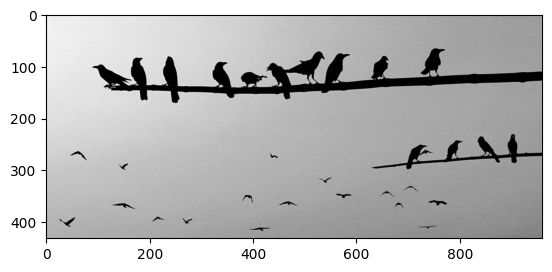

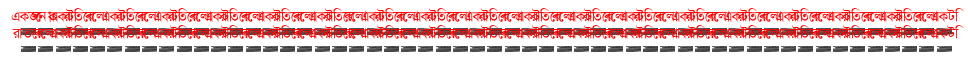

In [ ]:
cap_test_data = test_caption_bangla.copy()
rid = 400
test_image= test_data_bangla[rid]
real_caption = grouped_df.loc[grouped_df['filename_bn'] == test_image, 'captions_bn'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একজন পুরুষ ক্যামেরা দিয়ে ছবি তুলছে', 'একটি লোক ক্যামেরা দিয়ে ছবি তুলছে']
Prediction Caption: একটি ভিড় সহ একটি ভিড়
BLEU-1: 16.374615
BLEU-2: 7.344517
BLEU-3: 4.370762
BLEU-4: 3.737481
Meteor Score: 0.084746


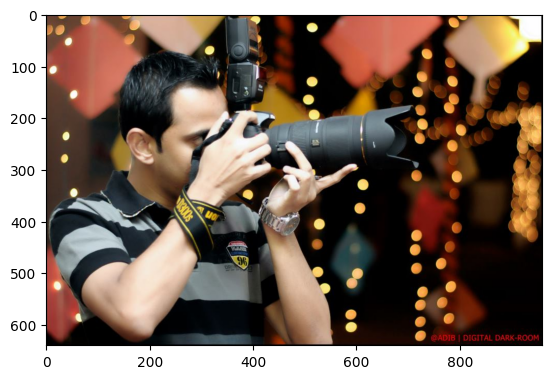

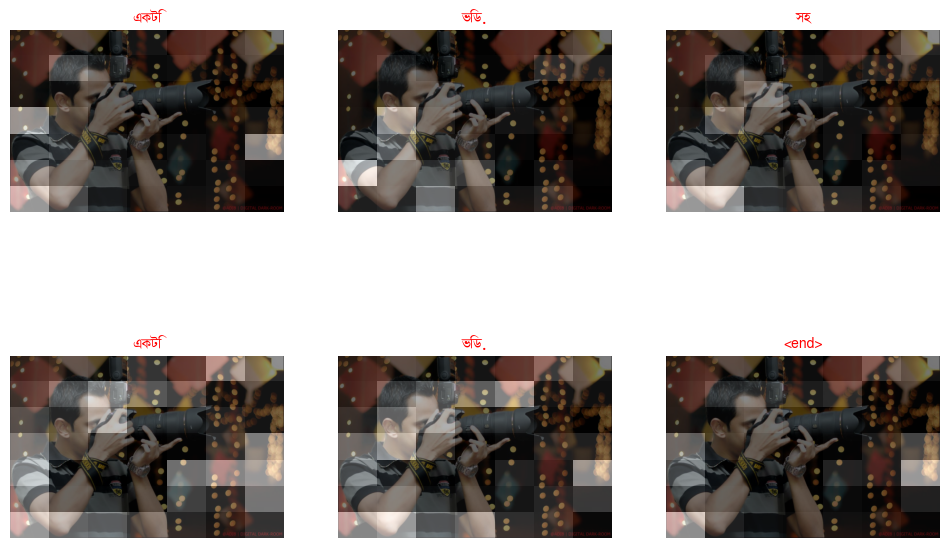

In [ ]:
cap_test_data = test_caption_bangla.copy()
rid = 435
test_image= test_data_bangla[rid]
real_caption = grouped_df.loc[grouped_df['filename_bn'] == test_image, 'captions_bn'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কয়েকজন মানুষ দাড়িয়ে আছে', 'কয়েকজন ছোট ছেলে মেয়েকে পড়াশুনা করাচ্ছে']
Prediction Caption: নীল রঙের একটি মেয়ে একটি বাদামি ও একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট একটি ছোট
BLEU-1: 0.934579
BLEU-2: 0.641867
BLEU-3: 0.372767
BLEU-4: 0.318555
Meteor Score: 0.031056


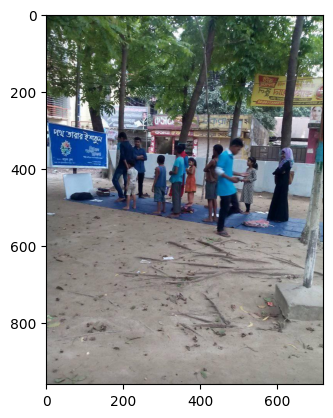

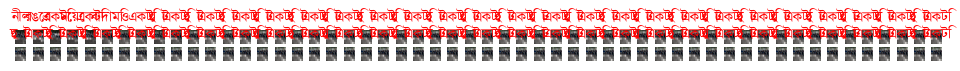

In [ ]:
cap_test_data = test_caption_bangla.copy()
rid = 311
test_image= test_data_bangla[rid]
real_caption = grouped_df.loc[grouped_df['filename_bn'] == test_image, 'captions_bn'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কয়েকটি বই আছে', 'অনেকগুলো কোরআন একসাথে সাজিয়ে রয়েছে']
Prediction Caption: একজন লোক একটি রেস্টুরেন্টে একটি রেস্টুরেন্টে প্রতিযোগিতা করছে
BLEU-1: 0.000000
BLEU-2: 0.000000
BLEU-3: 0.000000
BLEU-4: 0.000000
Meteor Score: 0.000000


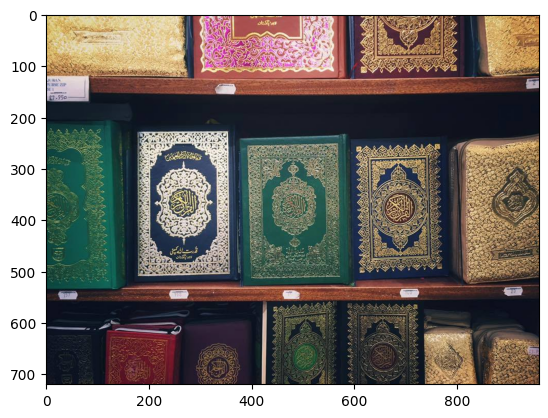

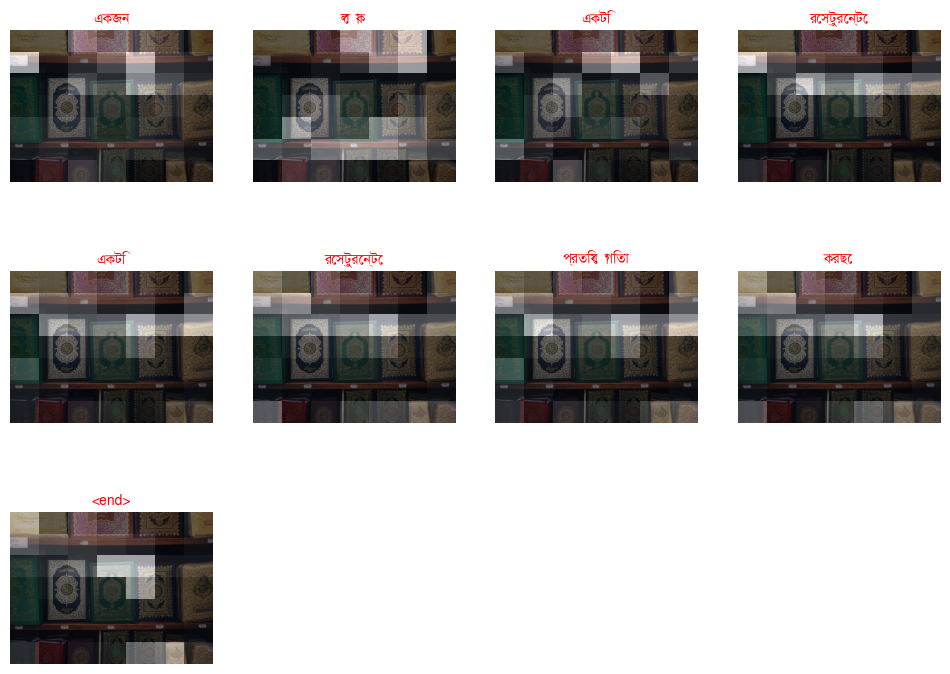

In [ ]:
cap_test_data = test_caption_bangla.copy()
rid = 235
test_image= test_data_bangla[rid]
real_caption = grouped_df.loc[grouped_df['filename_bn'] == test_image, 'captions_bn'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একজন পুরুষ একটি নৌকা চালাচ্ছে', 'চারদিকে কাশফুলের বাগান আর নদীতে মাঝি একটা নৌকা বাইচে']
Prediction Caption: এক লোক নদীতে একটি লাল রঙের সরু নৌকা চালাচ্ছে
BLEU-1: 44.444444
BLEU-2: 23.570226
BLEU-3: 10.704524
BLEU-4: 7.517082
Meteor Score: 0.473251


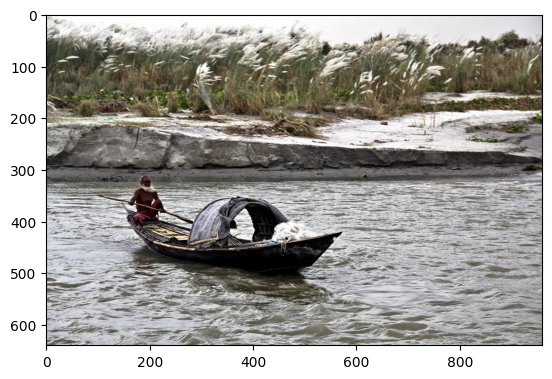

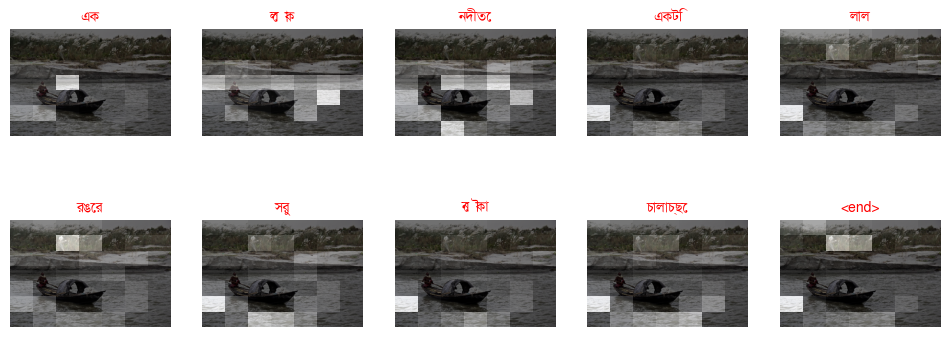

In [ ]:
cap_test_data = test_caption_bangla.copy()
rid = 700
test_image= test_data_bangla[rid]
real_caption = grouped_df.loc[grouped_df['filename_bn'] == test_image, 'captions_bn'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
b1_bangla=[]
b2_bangla=[]
b3_bangla=[]
b4_bangla=[]
m_score_bangla = []

for rid in range(0,len(test_data_bangla)):
  test_image= test_data_bangla[rid]
  real_caption = grouped_df.loc[grouped_df['filename_bn'] == test_image, 'captions_bn'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1_bangla.append(bleu1)
  b2_bangla.append(bleu2)
  b3_bangla.append(bleu3)
  b4_bangla.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score_bangla.append(score)

একজন ব্যক্তি যুবতী হাত দিয়ে দাঁড়িয়ে আছে
একজন মহিলা একটি মেয়ের সাথে বসে আছেন
একটি হাসিখুশি ছেলে সবুজ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের জলে হলুদ রঙের টুকরো সবুজ জল হলুদ রঙের জলে হলুদ রঙের
বেগুনি জামা পরিহিত কয়েকজন মেয়ে বসে আছে এবং একজন লোক বসে আছেন
সবুজ জলের উপরে একটি ছোট কর্দমাক্ত পুকুরে বসে আছে
একটি শিশু রোলার স্কেট করছে
মানুষজন একটি মাটির রাস্তায় অনেকগুলো প্রাপ্তবয়স্করা তাদের শিশু একসাথে ভিড় করে
প্লেড টুপি পরা দুজন লোক একটি ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছোট ছ

In [ ]:
# zero shot with banglalekha
print('BLEU-1: %f' % np.mean(b1_bangla))
print('BLEU-2: %f' % np.mean(b2_bangla))
print('BLEU-3: %f' % np.mean(b3_bangla))
print('BLEU-4: %f' % np.mean(b4_bangla))

BLEU-1: 12.262544
BLEU-2: 5.576896
BLEU-3: 2.957621
BLEU-4: 2.313632


In [ ]:
print('Meteor Score zero short banglalekha : %f' % np.mean(m_score_bangla))

Meteor Score zero short banglalekha : 0.074847


## Zero shot with Bornon

In [ ]:
import zipfile
exfile= '/content/drive/MyDrive/Image Caption Generation /Bornon/Bornon Images-20221222T175856Z-001.zip'
zip_ref = zipfile.ZipFile(exfile, 'r')
zip_ref.extractall()
zip_ref.close()

In [ ]:
from os import listdir

image_dir = '/content/Bornon Images'
images_bornon = listdir(image_dir)

In [ ]:
len(images_bornon)

4106

In [ ]:
train_captions_bornon = load(open('/content/drive/MyDrive/Image Caption Generation /Bornon/bornon_captions.pkl', 'rb'))
img_name_vector_bornon = load(open('/content/drive/MyDrive/Image Caption Generation /Bornon/bornon_img_names.pkl', 'rb'))

In [ ]:
bornon_df = pd.DataFrame(list(zip(img_name_vector_bornon, train_captions_bornon)),
               columns =['filename_bornon', 'captions_bornon'])
bornon_df.head(10)

,filename_bornon,captions_bornon
0,/content/Bornon Images/1.jpg,<start> একটি পার্কে একটি লেক আছে <end>
1,/content/Bornon Images/1.jpg,<start> লেকের উপর একটি ব্রীজ আছে <end>
2,/content/Bornon Images/1.jpg,<start> গাছপালায় ঘেরা এই পার্কটি খুবই মনমু...
3,/content/Bornon Images/1.jpg,<start> লেকের উপর একটি ব্রীজ আছে <end>
4,/content/Bornon Images/1.jpg,<start> পানির উপর আকাশের প্রতিচ্ছবি দেখা যা...
5,/content/Bornon Images/2.jpg,<start> একজন মানুষ মাথায় খড় নিয়ে হেটে যা...
6,/content/Bornon Images/2.jpg,<start> একজন মানুষ ও দু টি খড়ের স্তূপ দেখা...
7,/content/Bornon Images/2.jpg,<start> লুঙ্গি পড়া একজন মানুষ খড়ের উপর হে...
8,/content/Bornon Images/2.jpg,<start> দুটি খড়ের স্তূপের পেছনে অনেক গাছপা...
9,/content/Bornon Images/2.jpg,<start> অনেক গাছপালার সামনে দুটি খড়ের স্তূ...


In [ ]:
len(bornon_df.filename_bornon)

20439

In [ ]:
len(bornon_df.captions_bornon)

20439

In [ ]:
grouped_bornon = bornon_df.groupby('filename_bornon')['captions_bornon'].apply(list).reset_index(name='captions_bornon')
grouped_bornon['captions_bornon'] = [[caption.split() for caption in captions] for captions in grouped_bornon['captions_bornon']]

In [ ]:
for i, row in grouped_bornon.iterrows():
    captions = row['captions_bornon']
    captions = [caption[1:-1] for caption in captions]
    grouped_bornon.at[i, 'captions_bornon'] = captions

In [ ]:
grouped_bornon['captions_bornon'][4]

[['একটি', 'লোক', 'ঝর্ণার', 'সামনে', 'দারিয়ে', 'আছে'],
 ['একটি',
  'লোক',
  'পাহাড়ের',
  'সামনে',
  'দারিয়ে',
  'আছে',
  'এবং',
  'পাহাড়',
  'থেকে',
  'পানি',
  'পড়ছে'],
 ['পাহাড়',
  'থেকে',
  'পানি',
  'পড়ছে',
  'ঝর্ণার',
  'আকারে',
  'এবং',
  'একটি',
  'লোক',
  'দারিয়ে',
  'আছে'],
 ['একজন', 'লোক', 'পাহাড়ের', 'সামনে', 'দারিয়ে', 'ঝর্ণা', 'দেখছে'],
 ['একজন', 'লোক', 'ঝর্ণার', 'দিকে', 'তাকিয়ে', 'আছে']]

In [ ]:
train_data_bornon, test_data_bornon, train_caption_bornon, test_caption_bornon = train_test_split(img_name_vector_bornon, train_captions_bornon, test_size = 0.1, random_state = 42)

Real Caption: ['হাস্যজ্জল একটি মেয়ে', 'একটি মেয়ে দাঁড়িয়ে হাসছে', 'বিকেলের স্নিগ্ধ রোদে দাঁড়িয়ে থাকা একটি মেয়ে', 'হাস্যজ্জল মেয়ে দাঁড়িয়ে আছে', 'একটি মেয়ে সবুজ জামা পড়ে দাঁড়িয়ে আছে']
Prediction Caption: কালো রঙের জামা পরিহিত এক মেয়ে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট পরিহিত এক ছেলে একটি গ্রাফিতি আঁকা দেয়ালের সামনে এক ব্যক্তি একটি ছেলের জ্যাকেট
BLEU-1: 1.869159
BLEU-2: 0.907737
BLEU-3: 0.468573
BLEU-4: 0.378828
Meteor Score: 0.058824


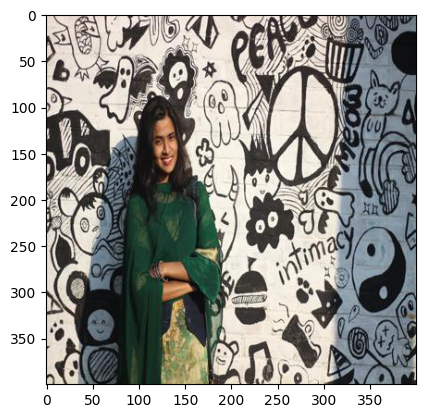

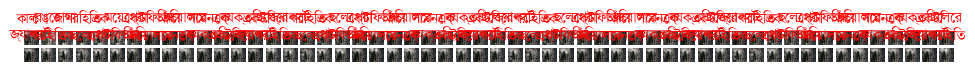

In [ ]:
cap_test_data = test_caption_bornon.copy()
rid = 100
test_image= test_data_bornon[rid]
real_caption = grouped_bornon.loc[grouped_bornon['filename_bornon'] == test_image, 'captions_bornon'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['কিছু গাছ দৃশ্যমান', 'একটি খেজুর গাছ দৃশ্যমান', 'একটি ছেলে দৃশ্যমান', 'একটি ছেলে গাছে উঠার চেষ্টা করছে', 'একটি পুকুর দৃশ্যমান']
Prediction Caption: একজন লোক পাথরে আরোহণ করছে
BLEU-1: 20.000000
BLEU-2: 8.970613
BLEU-3: 5.338461
BLEU-4: 4.564969
Meteor Score: 0.084746


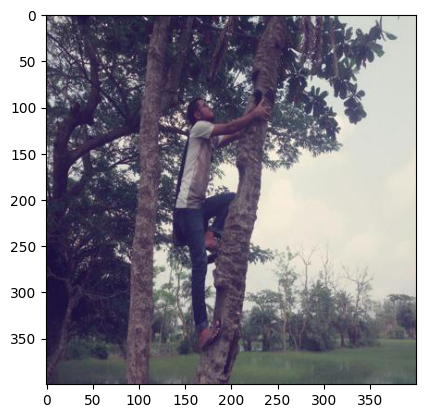

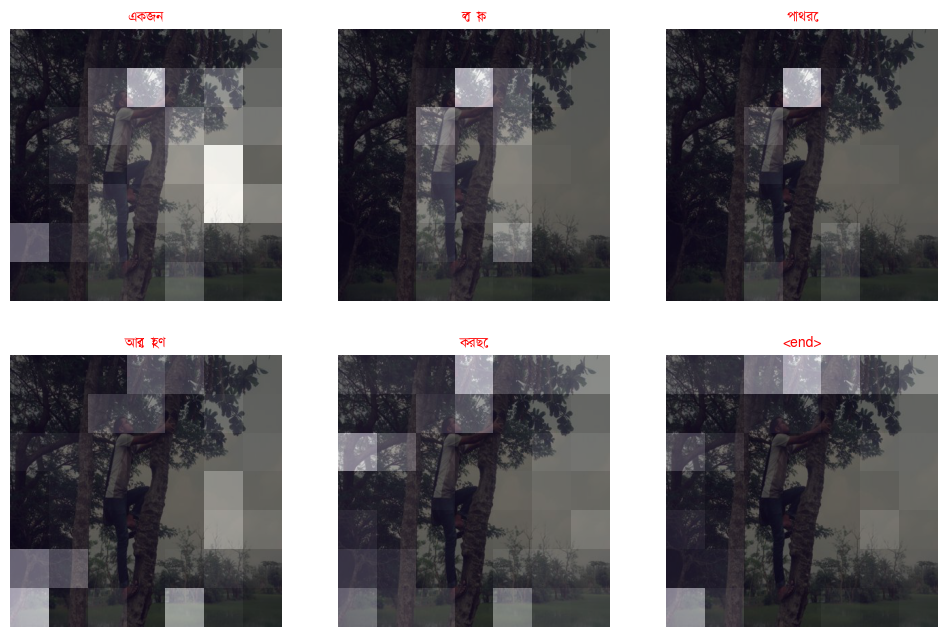

In [ ]:
cap_test_data = test_caption_bornon.copy()
rid = 435
test_image= test_data_bornon[rid]
real_caption = grouped_bornon.loc[grouped_bornon['filename_bornon'] == test_image, 'captions_bornon'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি বাটিতে খাবার আছে', 'একটি বাটিতে অনেক ধরনের খাবার আছে', 'প্যানকেক আছে', 'মাশরুম আছে', 'সসেজ আছে']
Prediction Caption: একটি শিশু একটি গোলাপী বলের উপর খেলছে
BLEU-1: 14.285714
BLEU-2: 6.806702
BLEU-3: 3.951061
BLEU-4: 3.235935
Meteor Score: 0.116279


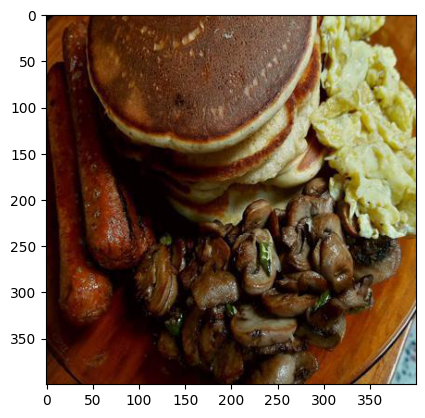

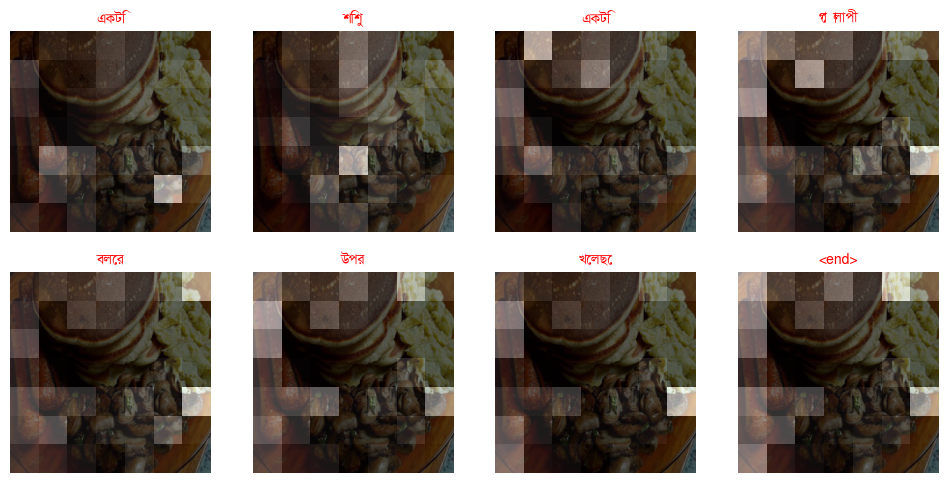

In [ ]:
cap_test_data = test_caption_bornon.copy()
rid = 311
test_image= test_data_bornon[rid]
real_caption = grouped_bornon.loc[grouped_bornon['filename_bornon'] == test_image, 'captions_bornon'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি পাহাড় আছে', 'অনেকগুলো গাছ আছে', 'একটি পাহাড়ে অনেক গাছ আছে', 'একটি গাছে অনেক শুকনো পাতা আছে', 'আকাশের নিচে একটি পাহাড় আছে']
Prediction Caption: একটি সাদা পাহাড়ি একটি গাছের একটি বাদামী বাদ্যযন্ত্র বাজাচ্ছে
BLEU-1: 11.111111
BLEU-2: 5.524220
BLEU-3: 3.179252
BLEU-4: 2.573285
Meteor Score: 0.138889


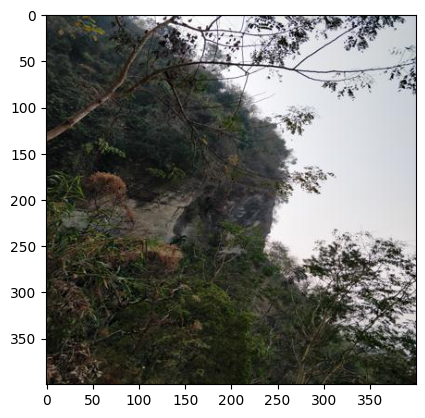

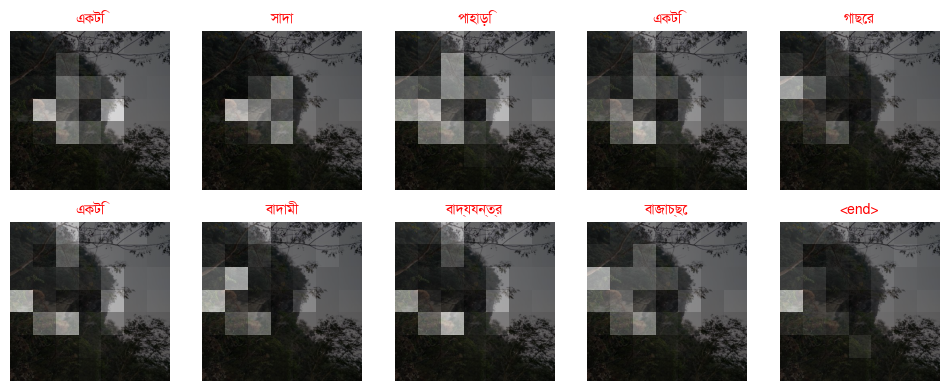

In [ ]:
cap_test_data = test_caption_bornon.copy()
rid = 161
test_image= test_data_bornon[rid]
real_caption = grouped_bornon.loc[grouped_bornon['filename_bornon'] == test_image, 'captions_bornon'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

Real Caption: ['একটি বিড়াল দেখা যাচ্ছে', 'বিড়ালটি সাদা ও কামালা রঙের', 'বিড়ালটি সুয়ে আছে', 'দুটি বড়বড় কান দেখা যাচ্ছে', 'একটি মাঠ দেখা যাচ্ছে']
Prediction Caption: একটি বাদামী কুকুরটি একটি ছোট্ট বালতি ধরে রেখেছে
BLEU-1: 12.500000
BLEU-2: 6.093676
BLEU-3: 3.518549
BLEU-4: 2.859962
Meteor Score: 0.113636


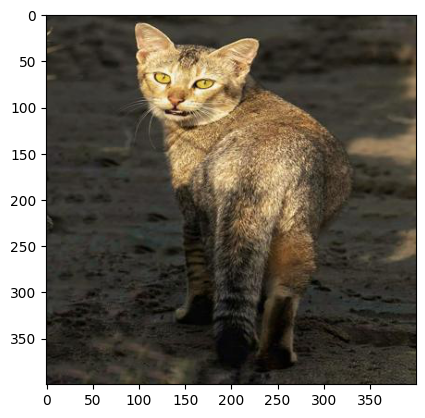

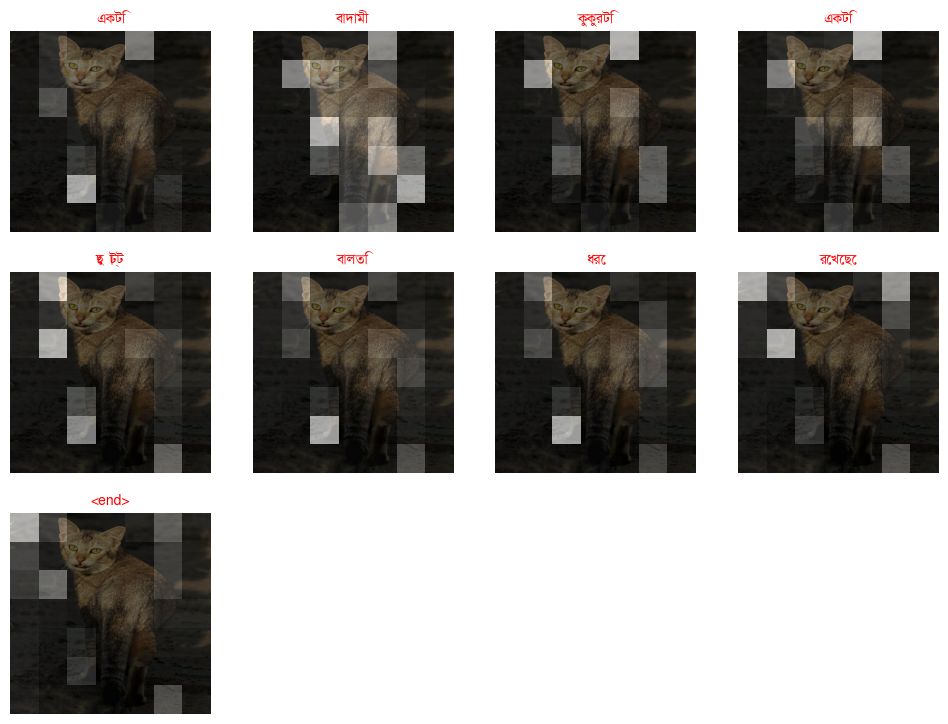

In [ ]:
cap_test_data = test_caption_bornon.copy()
rid = 235
test_image= test_data_bornon[rid]
real_caption = grouped_bornon.loc[grouped_bornon['filename_bornon'] == test_image, 'captions_bornon'].values[0]
captions_sentences = []
for caption in real_caption:
    sentence = ' '.join(caption)
    captions_sentences.append(sentence)
result, attention_plot, pred_test = evaluate(test_image)
pred_caption=' '.join(result).rsplit(' ', 1)[0]
reference = real_caption
candidate = pred_caption.split()
temp_img = np.array(Image.open(test_image))
plt.imshow(temp_img)
smooth = SmoothingFunction().method4
bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
print ('Real Caption:', captions_sentences)
print ('Prediction Caption:', pred_caption)
print('BLEU-1: %f' % bleu1)
print('BLEU-2: %f' % bleu2)
print('BLEU-3: %f' % bleu3)
print('BLEU-4: %f' % bleu4)

score = meteor_score(reference,candidate)
print('Meteor Score: %f' % score)
plot_attention_map(result, attention_plot, test_image)

In [ ]:
b1_bornon=[]
b2_bornon=[]
b3_bornon=[]
b4_bornon=[]
m_score_bornon= []

for rid in range(0,len(test_data_bornon)):
  test_image= test_data_bornon[rid]
  real_caption = grouped_bornon.loc[grouped_bornon['filename_bornon'] == test_image, 'captions_bornon'].values[0]
  result, attention_plot, pred_test = evaluate(test_image)
  pred_caption=' '.join(result).rsplit(' ', 1)[0]
  reference = real_caption
  candidate = pred_caption.split()
  print(pred_caption)
  smooth = SmoothingFunction().method4
  bleu1 = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=smooth)*100
  bleu2 = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth)*100
  bleu3 = sentence_bleu(reference, candidate, weights=(0.33, 0.33, 0.37, 0), smoothing_function=smooth)*100
  bleu4 = sentence_bleu(reference, candidate, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smooth)*100
  b1_bornon.append(bleu1)
  b2_bornon.append(bleu2)
  b3_bornon.append(bleu3)
  b4_bornon.append(bleu4)
  score = meteor_score(reference,candidate)
  m_score_bornon.append(score)

একটি ছোট মেয়ে বাতাসে ছুড়ে মারে
একদল লোক একটি পাম গাছের সামনে রয়েছে
একটি ব্যক্তি তার খালি পুলের তীরে কাঠের উপর দিয়ে জল ও বিকিনি তীরে দড়িতে লাফ দিচ্ছে
গাছের পাশে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের পাশে গাছের নিচে গাছের পাশে গাছের নিচে গাছের পাশে গাছের
তুষার তবে রাগবি খেলছে
একজন পুলিশ ফলের টেবিল চেয়ার এর পাশে সামনে দাঁড়িয়ে আছে
একটি ছোট ছেলে বসে আছে
একটি ছোট বাচ্চা একটি সাদা প্লাস্টিকের ট্রাকের উপর আছে
গাছের ডাল নিয়ে গাছের ডাল নিয়ে মেয়েটি লাঠি নিয়ে খেলছে
একটি ছোট ছায়া একটি পাথর নিয়ে একটি পাথর নিয়ে একটি পাথর

InvalidArgumentError: ignored

In [ ]:
# zero shot with bornon
print('BLEU-1: %f' % np.mean(b1_bornon))
print('BLEU-2: %f' % np.mean(b2_bornon))
print('BLEU-3: %f' % np.mean(b3_bornon))
print('BLEU-4: %f' % np.mean(b4_bornon))

BLEU-1: 14.014058
BLEU-2: 6.370982
BLEU-3: 3.513845
BLEU-4: 2.775124


In [ ]:
print('Meteor Score zero short bornon : %f' % np.mean(m_score_bornon))

Meteor Score zero short bornon : 0.104518
